Download Dataset

In [1]:
import os
import kagglehub

file_path = os.path.join(os.getcwd(), "datasets")
print("Dataset directory:", file_path)

if not os.path.exists(file_path) or not os.listdir(file_path):
    path = kagglehub.dataset_download("andrewmvd/lung-and-colon-cancer-histopathological-images")
    print("Downloaded dataset to:", path)
else:
    print("Dataset already exists at:", file_path)
    print("Contents:", os.listdir(file_path))

Dataset directory: /content/datasets


100%|██████████| 1.76G/1.76G [00:44<00:00, 42.2MB/s]

Extracting files...


Downloaded dataset to: /root/.cache/kagglehub/datasets/andrewmvd/lung-and-colon-cancer-histopathological-images/versions/1


In [2]:
!pip install keras_tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 6.0 MB/s eta 0:00:00


Import required libraries

In [3]:
import tensorflow as tf
import keras
import keras_tuner as kt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import random
import shutil
import tensorflow as tf

In [4]:
file_path = "/root/.cache/kagglehub/datasets/"
print(os.listdir(file_path))

['andrewmvd']


MV required dataset to the main_directory

In [5]:
lung_colon = os.path.join(
    file_path,
    "andrewmvd",
    "lung-and-colon-cancer-histopathological-images",
    "versions",
    "1",
    "lung_colon_image_set"
)
print(os.listdir(lung_colon))

['lung_image_sets', 'colon_image_sets']


In [ ]:
# ds = tf.keras.utils.image_dataset_from_directory(
#     lung_colon,
#     labels='inferred',
#     label_mode='categorical',
#     image_size=(224, 224),
#     batch_size=32
# )

# print("Detected class folders:", ds.class_names)
# print("Number of class folders:", len(ds.class_names))

Now map folders for their name

In [23]:
top_level_dirs = [d for d in os.listdir(lung_colon) if os.path.isdir(os.path.join(lung_colon, d))]
print("Top-level directories:", top_level_dirs)

# Now, list directories inside 'colon_image_sets'
colon_image_sets_path = os.path.join(lung_colon, "colon_image_sets")
colon_subdirs = [d for d in os.listdir(colon_image_sets_path) if os.path.isdir(os.path.join(colon_image_sets_path, d))]
print("Subdirectories in colon_image_sets:", colon_subdirs)


lung_image_sets = os.path.join(lung_colon, "lung_image_sets")
lung_subdirs = [d for d in os.listdir(lung_image_sets) if os.path.isdir(os.path.join(lung_image_sets, d))]
print("Subdirectories in lung_image_sets:", lung_subdirs)

classess = [lung_subdirs, colon_subdirs]
print("Classess:", classess)
class_labels = {
    "lung_aca": "Lung Adenocarcinoma",
    "lung_n": "Lung Benign Tissue (Normal)",
    "lung_scc": "Lung Squamous Cell Carcinoma",
    "colon_aca": "Colon Adenocarcinoma",
    "colon_n": "Colon Benign Tissue (Normal)"
}
print("Class labels:", class_labels)

Top-level directories: ['colon_image_sets', 'lung_image_sets']
Subdirectories in colon_image_sets: ['colon_aca', 'colon_n']
Subdirectories in lung_image_sets: ['lung_aca', 'lung_scc', 'lung_n']
Classess: [['lung_aca', 'lung_scc', 'lung_n'], ['colon_aca', 'colon_n']]
Class labels: {'lung_aca': 'Lung Adenocarcinoma', 'lung_n': 'Lung Benign Tissue (Normal)', 'lung_scc': 'Lung Squamous Cell Carcinoma', 'colon_aca': 'Colon Adenocarcinoma', 'colon_n': 'Colon Benign Tissue (Normal)'}


In [24]:
import os
import shutil

flat_dir = "/app/datasets/lung_colon_flat"
os.makedirs(flat_dir, exist_ok=True)

for top in os.listdir(lung_colon):
    top_path = os.path.join(lung_colon, top)
    if os.path.isdir(top_path):
        for class_dir in os.listdir(top_path):
            class_path = os.path.join(top_path, class_dir)
            dest_path = os.path.join(flat_dir, class_dir)
            # Only move if it's a directory and not already moved
            if os.path.isdir(class_path) and not os.path.exists(dest_path):
                shutil.move(class_path, dest_path)

print("Flattened class folders:", os.listdir(flat_dir))


Flattened class folders: ['colon_aca', 'lung_aca', 'lung_scc', 'colon_n', 'lung_n']


Prepared Datasets for training

In [25]:
import tensorflow as tf

BATCH_SIZE = 32
IMG_SIZE = (224, 224)

flat_dir = "/app/datasets/lung_colon_flat"

train_ds = tf.keras.utils.image_dataset_from_directory(
    flat_dir,
    labels='inferred',
    label_mode='categorical',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    validation_split=0.2,
    subset="training",
    seed=123
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    flat_dir,
    labels='inferred',
    label_mode='categorical',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    validation_split=0.2,
    subset="validation",
    seed=123
)

class_names = train_ds.class_names
for class_name in class_names:
  if class_labels.keys() == class_name:
    class_names = class_labels.values()
print("Class names:", class_names)


Found 25000 files belonging to 5 classes.
Using 20000 files for training.
Found 25000 files belonging to 5 classes.
Using 5000 files for validation.
Class names: ['colon_aca', 'colon_n', 'lung_aca', 'lung_n', 'lung_scc']


In [26]:
for class_name in os.listdir(flat_dir):
    print(class_name)
    if class_name == "lung_aca":
        print(os.listdir(os.path.join(flat_dir, class_name)))

colon_aca
lung_aca
['lungaca3279.jpeg', 'lungaca3720.jpeg', 'lungaca1185.jpeg', 'lungaca1511.jpeg', 'lungaca1595.jpeg', 'lungaca3012.jpeg', 'lungaca657.jpeg', 'lungaca2074.jpeg', 'lungaca4772.jpeg', 'lungaca1824.jpeg', 'lungaca1613.jpeg', 'lungaca4449.jpeg', 'lungaca2120.jpeg', 'lungaca4876.jpeg', 'lungaca4232.jpeg', 'lungaca1512.jpeg', 'lungaca4447.jpeg', 'lungaca1538.jpeg', 'lungaca879.jpeg', 'lungaca1857.jpeg', 'lungaca1626.jpeg', 'lungaca2128.jpeg', 'lungaca1506.jpeg', 'lungaca3264.jpeg', 'lungaca4327.jpeg', 'lungaca2083.jpeg', 'lungaca1663.jpeg', 'lungaca1316.jpeg', 'lungaca1266.jpeg', 'lungaca246.jpeg', 'lungaca1806.jpeg', 'lungaca1738.jpeg', 'lungaca3707.jpeg', 'lungaca3760.jpeg', 'lungaca1786.jpeg', 'lungaca2397.jpeg', 'lungaca3719.jpeg', 'lungaca449.jpeg', 'lungaca4063.jpeg', 'lungaca4391.jpeg', 'lungaca1688.jpeg', 'lungaca599.jpeg', 'lungaca3693.jpeg', 'lungaca1397.jpeg', 'lungaca4245.jpeg', 'lungaca700.jpeg', 'lungaca2489.jpeg', 'lungaca2960.jpeg', 'lungaca3658.jpeg', 'lunga

Build the CNN Model

In [27]:
from tensorflow.keras import layers, models

num_classes = len(class_names)

model = models.Sequential([
    layers.Rescaling(1./255, input_shape=IMG_SIZE + (3,)),
    layers.Conv2D(32, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation='softmax')
])

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,169,605 (42.61 MB)

 Trainable params: 11,169,605 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

Train the Model

In [ ]:
EPOCHS = 30

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 1836s 819ms/step - accuracy: 0.7406 - loss: 0.5469 - val_accuracy: 0.8294 - val_loss: 0.3878
Epoch 2/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 652s 1s/step - accuracy: 0.8010 - loss: 0.4398 - val_accuracy: 0.8264 - val_loss: 0.4363
Epoch 3/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 712s 1s/step - accuracy: 0.8589 - loss: 0.3356 - val_accuracy: 0.9132 - val_loss: 0.2308
Epoch 4/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 1172s 2s/step - accuracy: 0.9097 - loss: 0.2370 - val_accuracy: 0.9120 - val_loss: 0.2252
Epoch 5/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 1070s 2s/step - accuracy: 0.9253 - loss: 0.2006 - val_accuracy: 0.9404 - val_loss: 0.1589
Epoch 6/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 950s 2s/step - accuracy: 0.9402 - loss: 0.1582 - val_accuracy: 0.9400 - val_loss: 0.1489
Epoch 7/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 980s 2s/step - accuracy: 0.9570 - loss: 0.1180 - val_accuracy: 0.9412 - val_loss: 0.1438
Epoch 8/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 864s 1s/step - accuracy: 0.9647 - loss: 0.0944 - va

KeyboardInterrupt: 

In [ ]:
loss, accuracy = model.evaluate(val_ds)
print(f"Validation loss: {loss:.4f}")
print(f"Validation accuracy: {accuracy:.4f}")

2025-06-08 05:01:26.662572: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 201867264 exceeds 10% of free system memory.


  1/157 ━━━━━━━━━━━━━━━━━━━━ 2:36 1s/step - accuracy: 0.2812 - loss: 1.6044

2025-06-08 05:01:27.374949: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 201867264 exceeds 10% of free system memory.


  2/157 ━━━━━━━━━━━━━━━━━━━━ 37s 239ms/step - accuracy: 0.2422 - loss: 1.6063

2025-06-08 05:01:27.597103: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 201867264 exceeds 10% of free system memory.


  3/157 ━━━━━━━━━━━━━━━━━━━━ 39s 256ms/step - accuracy: 0.2309 - loss: 1.6032

2025-06-08 05:01:27.866441: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 201867264 exceeds 10% of free system memory.


  4/157 ━━━━━━━━━━━━━━━━━━━━ 41s 272ms/step - accuracy: 0.2240 - loss: 1.6035

2025-06-08 05:01:28.174475: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 201867264 exceeds 10% of free system memory.


142/157 ━━━━━━━━━━━━━━━━━━━━ 3s 230ms/step - accuracy: 0.1973 - loss: 1.6138

KeyboardInterrupt: 

In [ ]:
model.save('my_cancer_cnn_model.h5')
!ls

Dockerfile  my_cancer_cnn_model.h5  requirements.txt
datasets    notebooks		    run.sh


In [ ]:
!ls

Dockerfile  my_cancer_cnn_model.h5  requirements.txt
datasets    notebooks		    run.sh


In [ ]:
import numpy as np

for images, labels in val_ds.take(1):
    preds = model.predict(images)
    pred_classes = np.argmax(preds, axis=1)
    true_classes = np.argmax(labels.numpy(), axis=1)
    for i in range(len(images)):
        print(f"True: {class_names[true_classes[i]]}, Predicted: {class_names[pred_classes[i]]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step
True: colon_n, Predicted: colon_n
True: lung_scc, Predicted: colon_aca
True: lung_scc, Predicted: colon_aca
True: lung_n, Predicted: colon_n
True: lung_aca, Predicted: colon_aca
True: lung_scc, Predicted: colon_aca
True: colon_n, Predicted: colon_aca
True: lung_n, Predicted: colon_n
True: colon_aca, Predicted: colon_aca
True: lung_n, Predicted: colon_n
True: colon_n, Predicted: colon_aca
True: colon_aca, Predicted: colon_aca
True: colon_aca, Predicted: colon_n
True: colon_aca, Predicted: colon_aca
True: lung_n, Predicted: colon_aca
True: colon_n, Predicted: colon_aca
True: lung_scc, Predicted: colon_aca
True: lung_n, Predicted: colon_aca
True: colon_n, Predicted: colon_n
True: colon_aca, Predicted: colon_aca
True: colon_n, Predicted: colon_aca
True: colon_aca, Predicted: colon_n
True: lung_scc, Predicted: colon_aca
True: lung_n, Predicted: colon_aca
True: colon_aca, Predicted: colon_aca
True: lung_scc, Predicted: colon_aca
True: colon_aca, Predict

2025-06-08 04:45:17.737812: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np

img_path = "/app/datasets/lung_colon_flat/lung_aca/lungaca2296.jpeg"
img = image.load_img(img_path, target_size=IMG_SIZE)
img_array = image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # make batch of 1

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])
print(
    f"Predicted class: {class_names[np.argmax(score)]}, Confidence: {100 * np.max(score):.2f}%"
)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Predicted class: colon_aca, Confidence: 20.12%


In [ ]:
!pip install Augmentor imageio
import Augmentor, imageio, glob

p = Augmentor.Pipeline("/app/datasets/lung_colon_flat/lung_aca")
p.rotate(probability=1, max_left_rotation=25, max_right_rotation=25)
p.sample(8)

output_dir = "/app/datasets/lung_colon_flat/lung_aca/output"
print(glob.glob(f"{output_dir}/*"))  # Debug: should list your images

frames = []
for img_file in sorted(glob.glob(f"{output_dir}/*")):
    frames.append(imageio.imread(img_file))
if frames:
    imageio.mimsave('/app/datasets/lung_colon_flat/augmentation.gif', frames, duration=0.5)
else:
    print("No images found to make a GIF.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [Augmentor]
Initialised with 5000 image(s) found.
Output directory set to /app/datasets/lung_colon_flat/lung_aca/output.

Processing <PIL.Image.Image image mode=RGB size=768x768 at 0xFFFF79A928C0>: 100%|██████████| 8/8 [00:00<00:00, 58.64 Samples/s]

['/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca209.jpeg_1b0ac82f-06a7-4e52-a315-9eb4356b8d3c.jpeg', '/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca2098.jpeg_14fa0251-fe74-4b2c-a2f1-d5845df840de.jpeg', '/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca4779.jpeg_bb860026-f5db-4bf3-a4c2-71d11fa0429e.jpeg', '/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca1517.jpeg_96d4188b-e5c5-473a-9b8f-f67eb8505e6f.jpeg', '/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca4717.jpeg_76d2d18e-b9d0-45e2-88fb-fa82d622568e.jpeg', '/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca3544.jpeg_20e0ee20-ee56-4f0c-8f9e-23a25a9ca48b.jpeg', '/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca4911.jpeg_fca68e77-bb15-4573-a36b-1920e30c46c6.jpeg', '/app/datasets/lung_colon_flat/lung_aca/output/lung_aca_original_lungaca3184.jpeg_c343ca27-72aa-42e5-93ce-6bd9b03266c2


/tmp/ipykernel_9/4100820162.py:13: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames.append(imageio.imread(img_file))


In [ ]:
%pip install "numpy<2.2.0,>=1.26.0" --force-reinstall
%pip install --upgrade pip
%pip install --force-reinstall opencv-python


  Using cached numpy-2.1.3-cp310-cp310-manylinux_2_17_aarch64.manylinux2014_aarch64.whl (13.9 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.1.3
    Uninstalling numpy-2.1.3:
      Successfully uninstalled numpy-2.1.3

[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 1.6 MB/s eta 0:00:0000:0100:010m
  Attempting uninstall: pip
    Found existing installation: pip 23.0.1
    Uninstalling pip-23.0.1:
      Successfully uninstalled pip-23.0.1
Note: you may need to restart the kernel to use updated packages.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 MB 6.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.3/14.3 MB 12.8 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: numpy
    Found existing installation: numpy 2.1.3
    Uninstalling numpy-2.

In [ ]:
# tells Keras: “this model will see batches of 224×224×3 images”
model.build((None, 224, 224, 3))
import numpy as np

# one “fake” image full of zeros
dummy = np.zeros((1, 224, 224, 3), dtype=np.float32)
_ = model.predict(dummy)

NameError: name 'model' is not defined

In [ ]:
import tensorflow as tf
import numpy as np
import imageio

# 1. Pick one example image (H×W×C), e.g. first val sample:
for imgs, _ in val_ds.take(1):
    img = imgs[0].numpy().astype(np.uint8)
    break

# 2. Build a simple augmentation block:
data_augment = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),
])

# 3. Generate N augmentations and collect frames
frames = []
for _ in range(20):
    aug = data_augment(tf.expand_dims(img,0))[0].numpy().astype(np.uint8)
    frames.append(aug)

# 4. Write to GIF (will show up in your working dir)
imageio.mimsave("augmentation.gif", frames, fps=4)


In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    "/app/datasets/lung_colon_flat",
    labels="inferred",
    label_mode="categorical",
    image_size=(224,224),
    batch_size=32,
    validation_split=0.2,
    subset="both",
    seed=123
)
# after load or before extract:
model = tf.keras.models.load_model("my_cancer_cnn_model.h5")
model.build(input_shape=(None, 224, 224, 3))



Found 25024 files belonging to 5 classes.
Using 20020 files for training.
Using 5004 files for validation.


In [ ]:
from tensorflow.keras import Input, Model
import shutil

# 1. Load your weights-only or unbuilt model
model = tf.keras.models.load_model("my_cancer_cnn_model.h5")

# 2. Create a new Functional graph
inp = Input(shape=(224,224,3), name="act_in")
x = inp
activation_outputs = []

# 3. Re-apply every layer, and whenever it's a Conv2D, capture its output
for layer in model.layers:
    x = layer(x)
    if isinstance(layer, tf.keras.layers.Conv2D):
        activation_outputs.append(x)

# 4. Bundle into a single Model that goes from inp ⇒ [all conv outputs]
activation_model = Model(inputs=inp, outputs=activation_outputs)


In [ ]:
# assume `img` from above is uint8 H×W×3
import tensorflow as tf
import imageio.v2 as imageio

augment = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),
])
frames = []
for _ in range(20):
    a = augment(tf.expand_dims(img,0))[0].numpy().astype(np.uint8)
    frames.append(a)
imageio.mimsave("augmentation.gif", frames, fps=4)


In [ ]:
!ls

Dockerfile	  datasets		  notebooks	    run.sh
augmentation.gif  my_cancer_cnn_model.h5  requirements.txt


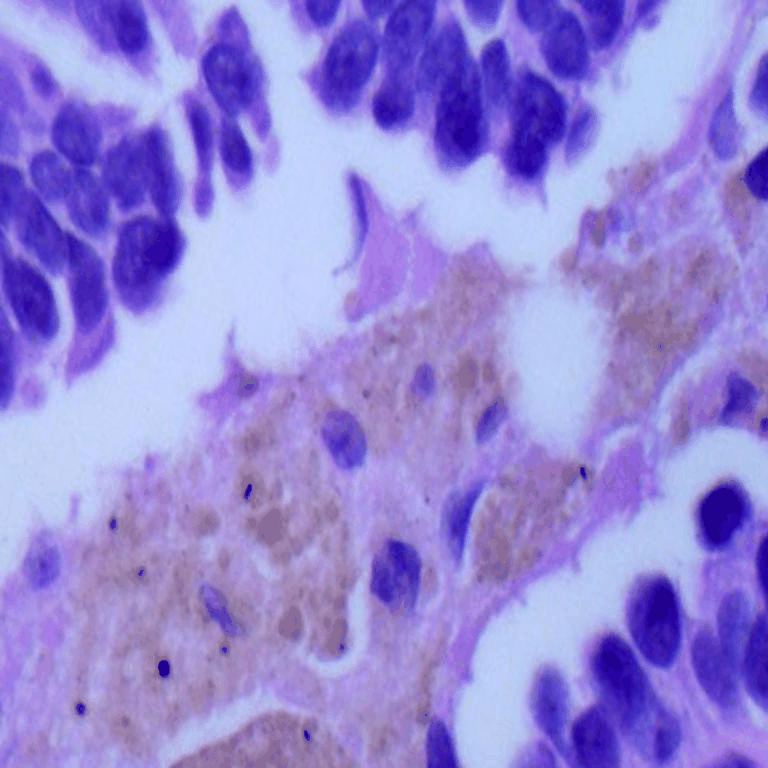

In [ ]:
from IPython.display import Image, display

# adjust the path if yours lives elsewhere
gif_path = "/app/datasets/lung_colon_flat/augmentation.gif"
display(Image(filename=gif_path))